<center>
<img src="https://supportvectors.ai/logo-poster-transparent.png" width="400px" style="opacity:0.7">
</center>

In [1]:
%run supportvectors-common.ipynb


<div style="color:#aaa;font-size:8pt">
<hr/>
&copy; SupportVectors. All rights reserved. <blockquote>This notebook is the intellectual property of SupportVectors, and part of its training material. 
Only the participants in SupportVectors workshops are allowed to study the notebooks for educational purposes currently, but is prohibited from copying or using it for any other purposes without written permission.

<b> These notebooks are chapters and sections from Asif Qamar's textbook that he is writing on Data Science. So we request you to not circulate the material to others.</b>
 </blockquote>
 <hr/>
</div>



## DeepFace — Face Recognition System

DeepFace is one of the earliest deep learning–based face recognition systems, introduced by Facebook AI Research in 2014.
It was a breakthrough because it showed that a deep neural network trained on millions of face images could approach human-level accuracy in verifying whether two faces belong to the same person.

Goal: Identify or verify who a person is.

Architecture: A deep convolutional neural network (CNN) that projects a face image into a 128- or 4096-dimensional embedding space, where similar faces are close together.

Key Idea: Once trained, faces are compared using cosine similarity between embeddings rather than raw pixels.

Modern Usage: The term DeepFace today also refers to an open-source Python library (by Serengil) that wraps several modern recognition models (e.g., ArcFace, FaceNet, VGGFace) for quick analysis of identity, emotion, age, and gender.

In short:

DeepFace = a face recognition system that extracts embeddings to determine who the person is.



## RetinaFace — Face Detection Model

RetinaFace (CVPR 2020) is a face detection framework — it doesn’t recognize who the person is, but rather finds where faces are in an image and locates key facial landmarks (eyes, nose, mouth corners).

Goal: Detect and localize faces robustly under different poses, lighting, or occlusions.

Architecture: Built on the RetinaNet object detector with feature pyramids, trained on large “in-the-wild” datasets.

Outputs:

Bounding boxes for each detected face

Five facial landmarks (two eyes, nose tip, mouth corners)

Optional 3D head-pose estimations

Strength: High accuracy even for tiny, rotated, or partially hidden faces — making it ideal as the first step before recognition.

In short:

RetinaFace = a face detection and alignment model that tells you where the faces are.



## How They Work Together

In modern pipelines:

RetinaFace detects and aligns faces in an image.

DeepFace (or another recognition model like ArcFace) encodes each cropped face into an embedding vector.

The embeddings are then compared or stored in a database for recognition or clustering.

So:

RetinaFace → detects faces.
DeepFace → recognizes faces.

## InsightFace — Unified Face Analysis Toolkit

InsightFace is a modern, all-in-one open-source framework for face detection, recognition, and analysis, developed by researchers at DeepInsight (China).
It combines the power of RetinaFace-style detectors and ArcFace-style embedders in a single, high-performance pipeline — making it the current state of the art in many practical systems.

What It Does

InsightFace is not just one model — it’s a toolkit containing multiple optimized sub-models for different facial tasks:

| Component | Task | Common Model |
|-----------|------|--------------|
| Detection | Locate faces in images | RetinaFace or SCRFD |
| Alignment | Normalize facial pose using landmarks | built-in |
| Recognition | Extract discriminative embeddings | ArcFace |
| Attribute Analysis | (optional) Estimate age, gender, or 3D head pose | auxiliary models |

So, InsightFace covers the entire pipeline:

detect → align → embed → compare

Key Features

ArcFace embeddings: Highly discriminative face representations with excellent separation in embedding space.

ONNX / PyTorch support: Runs efficiently on CPU, GPU, or Apple Silicon (CoreML).

Pre-packaged “model packs” (e.g., buffalo_l): Bundled detection + embedding + alignment networks.

Scalable: Used in industry for access control, surveillance, and authentication systems.

Open source & community-driven: Maintained by DeepInsight with academic and industrial contributions.

The python code at [face_detection](../../src/svlearn_vlu/face_detection/detect_and_embed.py) leverages `InsightFace` library with `buffalo_l` model pack to iterate through an images folder to extract reference faces that are then embedded and stored in `qdrant`.

Below, we view the extracted reference faces as well as the original images from where these reference faces were extracted

In [2]:
# iterate through the images in the faces folder and display them
from svlearn_vlu import config
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from pathlib import Path


In [3]:

faces_dir = config["datasets"]["reference_faces_dir"]

# Only process image files
image_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.tif'}

# Get all image files
image_files = []
for image_path in os.listdir(faces_dir):
    if Path(image_path).suffix.lower() in image_extensions:
        image_files.append(image_path)

# Display images in rows of 4
images_per_row = 4
total_images = len(image_files)


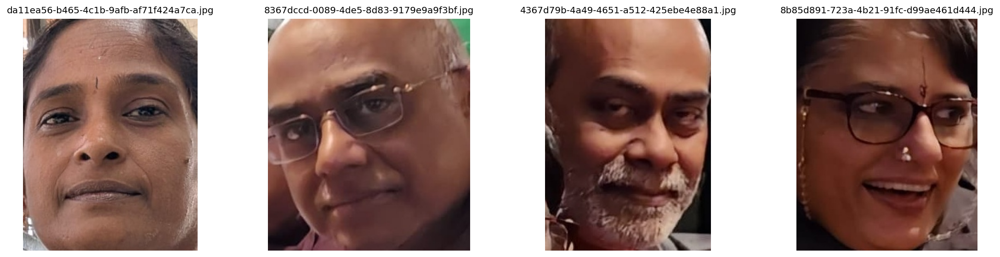

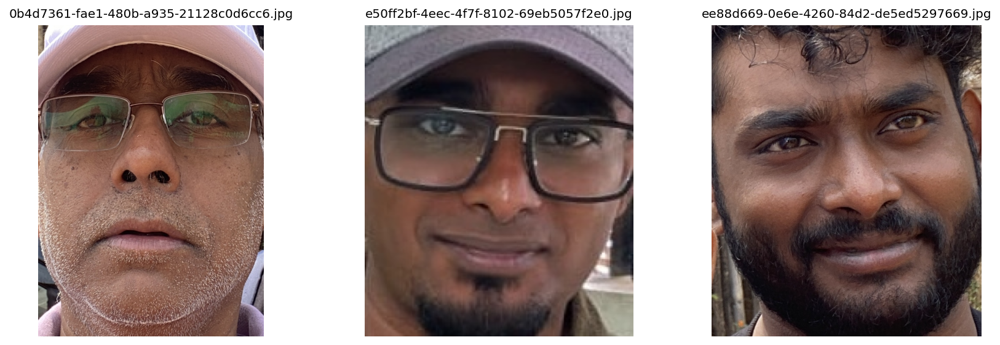

In [4]:

for i in range(0, total_images, images_per_row):
    # Calculate how many images in this row
    images_in_row = min(images_per_row, total_images - i)
    
    # Create subplot for this row
    fig, axes = plt.subplots(1, images_in_row, figsize=(4 * images_in_row, 4))
    
    # Handle case where there's only one image in the row
    if images_in_row == 1:
        axes = [axes]
    
    for j in range(images_in_row):
        image_path = image_files[i + j]
        image_path_full = os.path.join(faces_dir, image_path)
        
        # Load and display image
        img = mpimg.imread(image_path_full)
        axes[j].imshow(img)
        axes[j].set_title(f"{image_path}", fontsize=10)
        axes[j].axis('off')
    
    plt.tight_layout()
    plt.show()

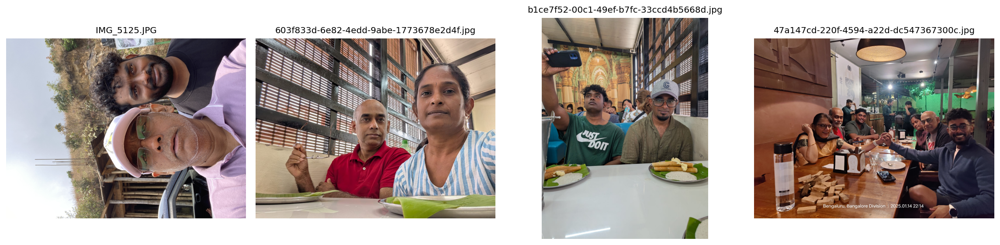

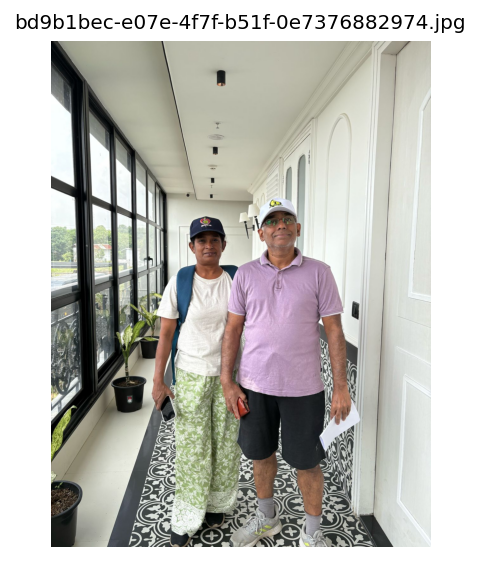

In [5]:
orig_images_dir = config["datasets"]["faces"]
image_files = []
for image_path in os.listdir(orig_images_dir):
    if Path(image_path).suffix.lower() in image_extensions:
        image_files.append(image_path)

# Display images in rows of 4
images_per_row = 4
total_images = len(image_files)
for i in range(0, total_images, images_per_row):
    # Calculate how many images in this row
    images_in_row = min(images_per_row, total_images - i)
    
    # Create subplot for this row
    fig, axes = plt.subplots(1, images_in_row, figsize=(4 * images_in_row, 4))
    
    # Handle case where there's only one image in the row
    if images_in_row == 1:
        axes = [axes]
    
    for j in range(images_in_row):
        image_path = image_files[i + j]
        image_path_full = os.path.join(orig_images_dir, image_path)
        
        # Load and display image
        img = mpimg.imread(image_path_full)
        axes[j].imshow(img)
        axes[j].set_title(f"{image_path}", fontsize=10)
        axes[j].axis('off')
    
    plt.tight_layout()
    plt.show()

Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /Users/chandarl/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /Users/chandarl/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /Users/chandarl/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /Users/chandarl/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /Users/chandarl/.insightface/models/buffalo_l/w600k_r50.onnx recognition ['None', 3, 112, 112]

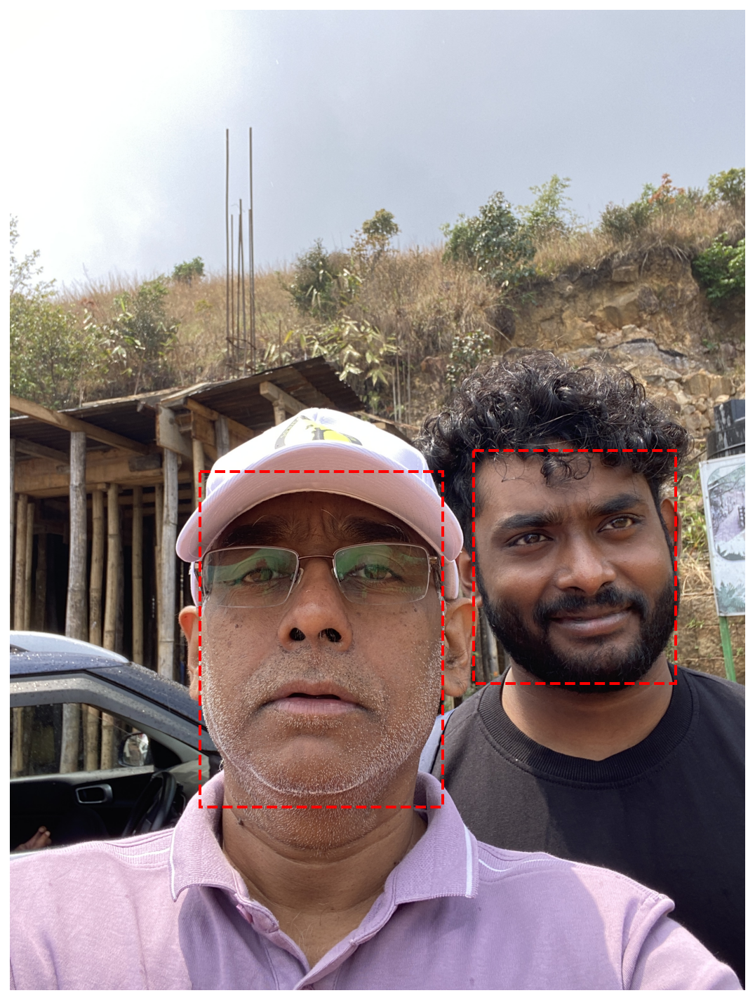

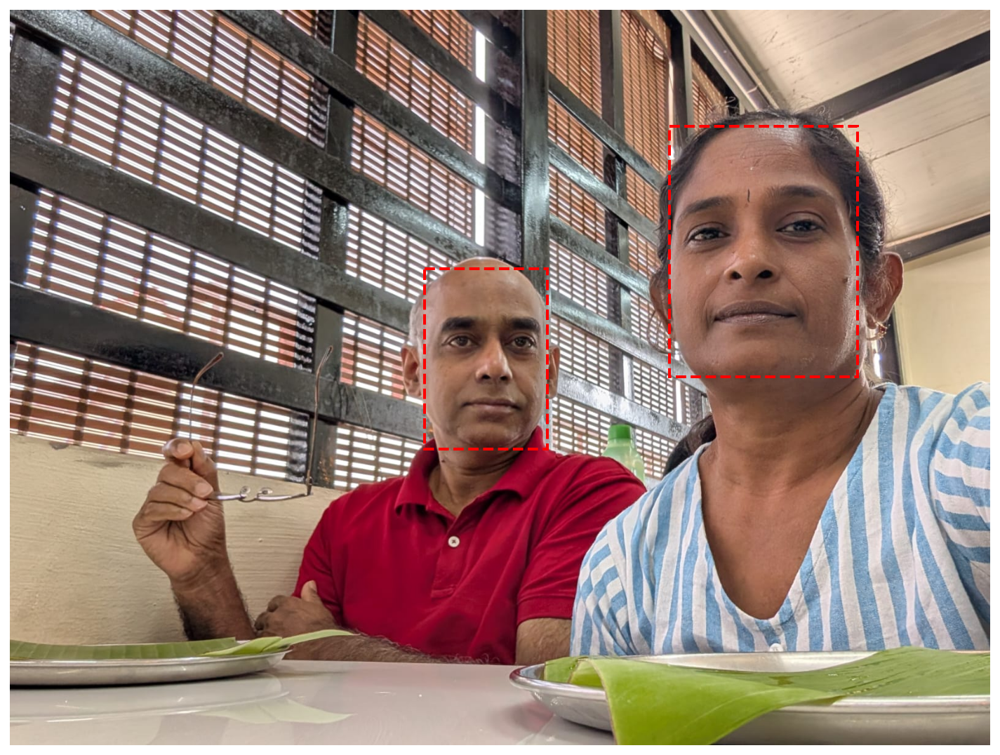

Skipping small face (34x41) in b1ce7f52-00c1-49ef-b7fc-33ccd4b5668d.jpg (<90px)
Skipping small face (59x77) in b1ce7f52-00c1-49ef-b7fc-33ccd4b5668d.jpg (<90px)
Skipping small face (32x37) in b1ce7f52-00c1-49ef-b7fc-33ccd4b5668d.jpg (<90px)
Skipping small face (45x81) in b1ce7f52-00c1-49ef-b7fc-33ccd4b5668d.jpg (<90px)


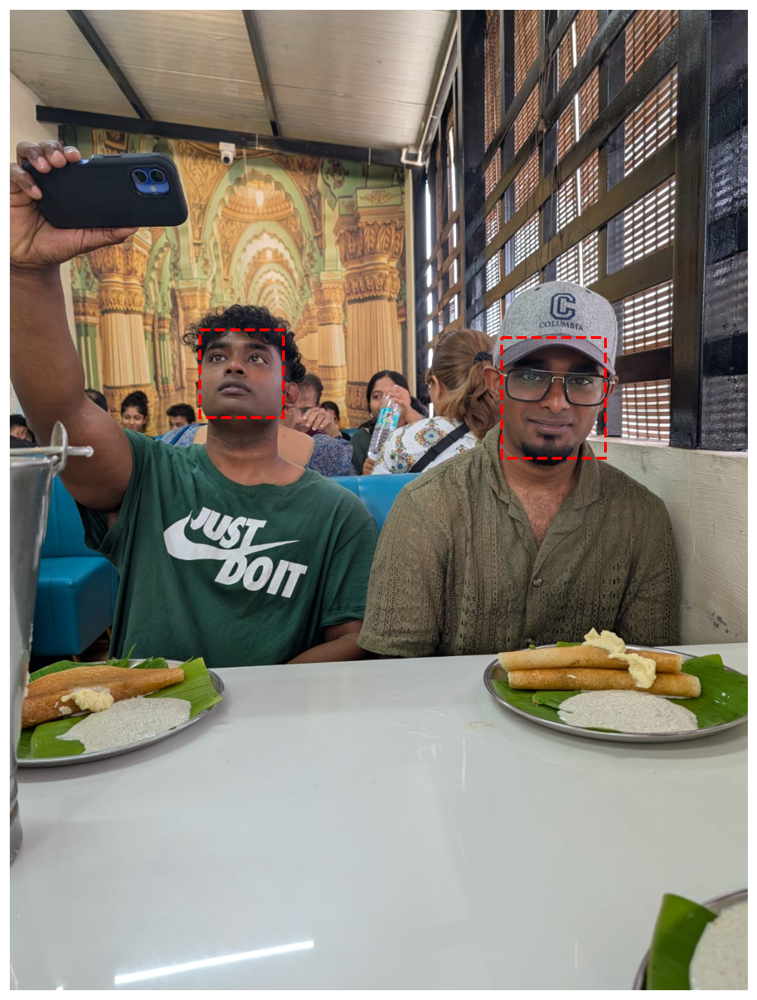

Skipping small face (70x90) in 47a147cd-220f-4594-a22d-dc547367300c.jpg (<90px)
Skipping small face (57x87) in 47a147cd-220f-4594-a22d-dc547367300c.jpg (<90px)
Skipping small face (64x78) in 47a147cd-220f-4594-a22d-dc547367300c.jpg (<90px)


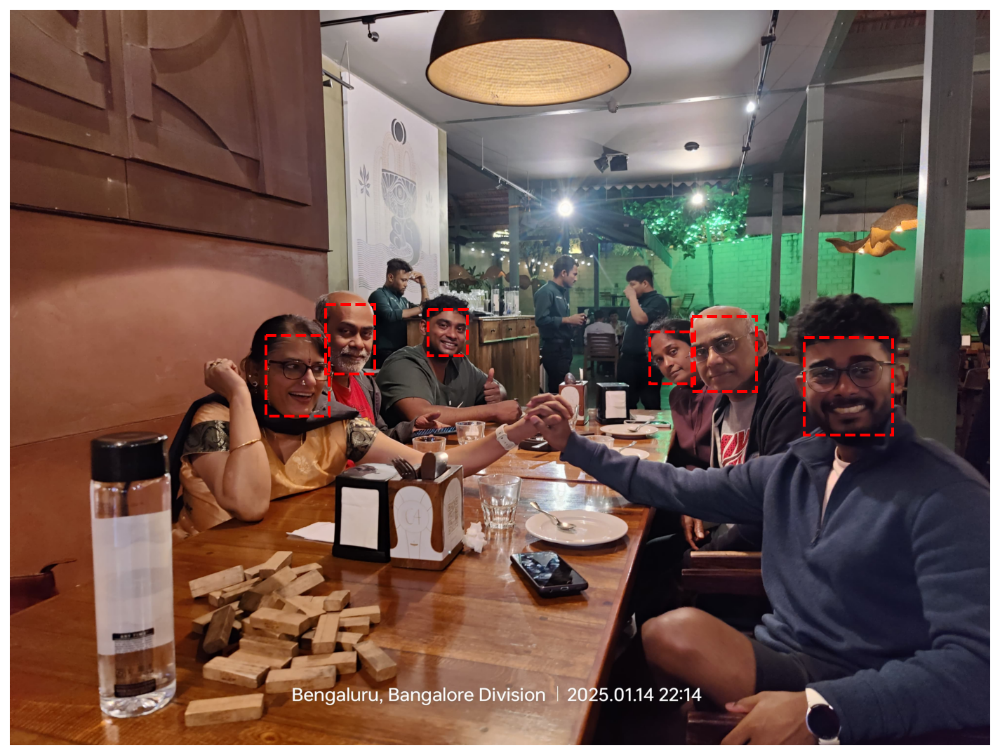

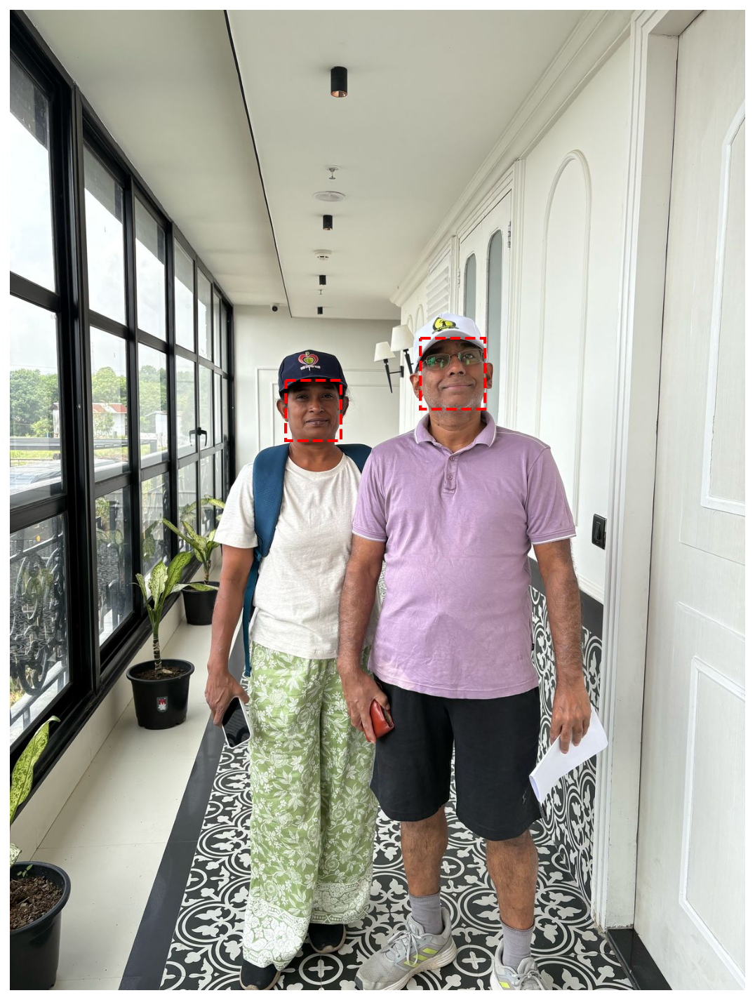

In [6]:
from svlearn_vlu.face_detection.detect_and_embed import get_face_embeddings
from matplotlib.patches import Rectangle
from PIL import Image, ImageOps
import numpy as np

def get_exif_orientation(image_path):
    """Get EXIF orientation tag from image."""
    try:
        from PIL.ExifTags import ORIENTATION
        img = Image.open(image_path)
        if hasattr(img, '_getexif') and img._getexif() is not None:
            exif = img._getexif()
            return exif.get(ORIENTATION, 1)
    except Exception:
        pass
    return 1  # Default: no rotation

def transform_bbox(x1, y1, x2, y2, img_width, img_height, orientation):
    """Transform bounding box coordinates based on EXIF orientation.
    
    cv2.imread() ignores EXIF, so coordinates are in raw image space.
    We need to transform them to match the displayed (EXIF-corrected) image.
    
    EXIF orientations:
    1 = Normal (0°)
    3 = Rotated 180°
    6 = Rotated 90° CW (raw image needs 90° CCW rotation to display)
    8 = Rotated 90° CCW (raw image needs 90° CW rotation to display)
    """
    if orientation == 1:  # Normal - no transformation needed
        return x1, y1, x2, y2
    elif orientation == 3:  # Rotated 180° - flip both axes
        new_x1 = img_width - x2
        new_y1 = img_height - y2
        new_x2 = img_width - x1
        new_y2 = img_height - y1
        return new_x1, new_y1, new_x2, new_y2
    elif orientation == 6:  # Raw rotated 90° CCW, needs 90° CCW to display (net: 0° from stored)
        # Actually: stored 90° CCW, display needs 90° CCW = same as stored orientation
        # But dimensions swap: (x, y) in raw -> (y, img_width - x) after 90° CCW
        new_x1 = y1
        new_y1 = img_width - x2
        new_x2 = y2
        new_y2 = img_width - x1
        return new_x1, new_y1, new_x2, new_y2
    elif orientation == 8:  # Raw rotated 90° CW, needs 90° CW to display
        # (x, y) in raw -> (img_height - y, x) after 90° CW
        new_x1 = img_height - y2
        new_y1 = x1
        new_x2 = img_height - y1
        new_y2 = x2
        return new_x1, new_y1, new_x2, new_y2
    else:
        # For other orientations (2, 4, 5, 7 - less common), return original
        # These involve flips which are handled less commonly
        return x1, y1, x2, y2

def load_image_with_exif(image_path):
    """Load image with EXIF orientation applied."""
    img = Image.open(image_path)
    # Apply EXIF orientation
    img = ImageOps.exif_transpose(img)
    return np.array(img)

image_folder = config["datasets"]["faces"]
image_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.webp'}

# For each image in the folder, get the faces and add a dotted bounding box to the image for each face bigger than 160x160
# and display the image with the bounding boxes using matplotlib
for item in os.listdir(image_folder):
    full_path = os.path.join(image_folder, item)
    if os.path.isfile(full_path) and os.path.splitext(item.lower())[1] in image_extensions:
        # Get faces (detection happens on raw image, coordinates in raw image space)
        faces = get_face_embeddings(full_path)
        
        # Load image with EXIF orientation applied for display
        img_display = load_image_with_exif(full_path)
        
        # Get raw image dimensions (as seen by cv2)
        img_raw = Image.open(full_path)
        raw_width, raw_height = img_raw.size
        
        # Get display image dimensions
        display_height, display_width = img_display.shape[:2]
        
        # Get EXIF orientation
        orientation = get_exif_orientation(full_path)
        
        fig, ax = plt.subplots(1, 1, figsize=(10, 10))
        ax.imshow(img_display)
        
        for face in faces:
            bbox = face["facial_area"]
            x1, y1, x2, y2 = map(int, bbox)

            h, w = y2 - y1, x2 - x1
            if h < 90 or w < 90:
                print(f"Skipping small face ({w}x{h}) in {item} (<{90}px)")
                continue

            # Transform bounding box coordinates to match displayed image
            x1_t, y1_t, x2_t, y2_t = transform_bbox(x1, y1, x2, y2, raw_width, raw_height, orientation)
            
            # Ensure coordinates are in correct order
            x1_final, x2_final = min(x1_t, x2_t), max(x1_t, x2_t)
            y1_final, y2_final = min(y1_t, y2_t), max(y1_t, y2_t)
            w_final = x2_final - x1_final
            h_final = y2_final - y1_final

            # Add dotted bounding box to the image for each face bigger than 160x160
            rect = Rectangle((x1_final, y1_final), w_final, h_final, linewidth=2, edgecolor='red', 
                           facecolor='none', linestyle='--')
            ax.add_patch(rect)
        
        ax.axis('off')
        plt.tight_layout()
        plt.show()




